<a href="https://colab.research.google.com/github/Sumedh-Ramteke/Leaf-Classification/blob/yolo/models/yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
print("GPU Available:", torch.cuda.is_available())
print("Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

GPU Available: True
Device Name: NVIDIA GeForce GTX 1650


In [15]:
# !pip install ultralytics
# !pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

In [2]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

### Data Path

In [3]:
data_yaml_path = '../roboflow/data.yaml'

# 1. Train the model

In [ ]:
# Load YOLO model
model = YOLO("yolov8n.pt")  # Using the small YOLOv8 model. Replace with yolov8s.pt/yolov8m.pt for larger models.

# Train the model
model.train(
    data=data_yaml_path,         # Path to your custom data.yaml file
    epochs=50,                # Number of epochs to train
    imgsz=640,                # Image size for training
    batch=16,                 # Batch size
    name="leaf_model",        # Name for the training run
    save=True,                # Save the model
    device="cuda"             # Use GPU for training
)

 74%|███████▍  | 4.62M/6.25M [00:01<00:00, 4.16MB/s]

# 2. Test the Model

In [4]:
# Load the trained model
model = YOLO("../best.pt")  # Path to trained weights

test_path = '../roboflow/test/images/'

# Perform inference on the test set
results = model.predict(
    source= test_path,  # Path to test images
    conf=0.5,                 # Confidence threshold
    iou=0.5,                  # Overlap threshold
    save=True,                # Save predictions
    device="cuda"             # Use GPU
)

# Save predicted images with bounding boxes in runs/predict/
print("Predictions saved to:", results[0].save_dir)


image 1/24 e:\!VNIT College\A. Pattern Recognition\Leaf\models\..\roboflow\test\images\IMG_20241029_131705_jpg.rf.d97c5c6b9f3efbaa9ff31f24ae43789f.jpg: 640x640 1 Hibiscus, 15.1ms
image 2/24 e:\!VNIT College\A. Pattern Recognition\Leaf\models\..\roboflow\test\images\IMG_20241029_131749_jpg.rf.2d5556b67a869eb01b351714665f610b.jpg: 640x640 1 Hibiscus, 23.3ms
image 3/24 e:\!VNIT College\A. Pattern Recognition\Leaf\models\..\roboflow\test\images\IMG_20241029_132013_jpg.rf.fb3889d0eb72115db2162ae3083bb008.jpg: 640x640 1 Hibiscus, 19.7ms
image 4/24 e:\!VNIT College\A. Pattern Recognition\Leaf\models\..\roboflow\test\images\IMG_20241029_132019_jpg.rf.ed0f5856e4c53303a6245aad8042e55d.jpg: 640x640 1 Hibiscus, 14.0ms
image 5/24 e:\!VNIT College\A. Pattern Recognition\Leaf\models\..\roboflow\test\images\IMG_20241029_132524_jpg.rf.cfb5a90ab2b04a40e0ed6799118431d4.jpg: 640x640 3 Fittonias, 14.5ms
image 6/24 e:\!VNIT College\A. Pattern Recognition\Leaf\models\..\roboflow\test\images\IMG_20241029_132

In [ ]:
output_dir = str(results[0].save_dir)
print(f"Predictions saved to: {output_dir}")

Predictions saved to: runs\detect\predict2


## Visualize Results

In [7]:
def load_true_labels(label_path):
    true_labels = []
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f:
                parts = line.strip().split()
                cls_id = int(parts[0])  # Class ID
                bbox = [float(x) for x in parts[1:]]  # Normalized bounding box [cx, cy, w, h]
                true_labels.append((cls_id, bbox))
    return true_labels

In [11]:
def denormalize_bbox(bbox, img_width, img_height):
    cx, cy, w, h = bbox
    x_min = int((cx - w / 2) * img_width)
    y_min = int((cy - h / 2) * img_height)
    x_max = int((cx + w / 2) * img_width)
    y_max = int((cy + h / 2) * img_height)
    return [x_min, y_min, x_max, y_max]

In [9]:
test_images_path = "../roboflow/test/images"
test_labels_path = "../roboflow/test/labels"

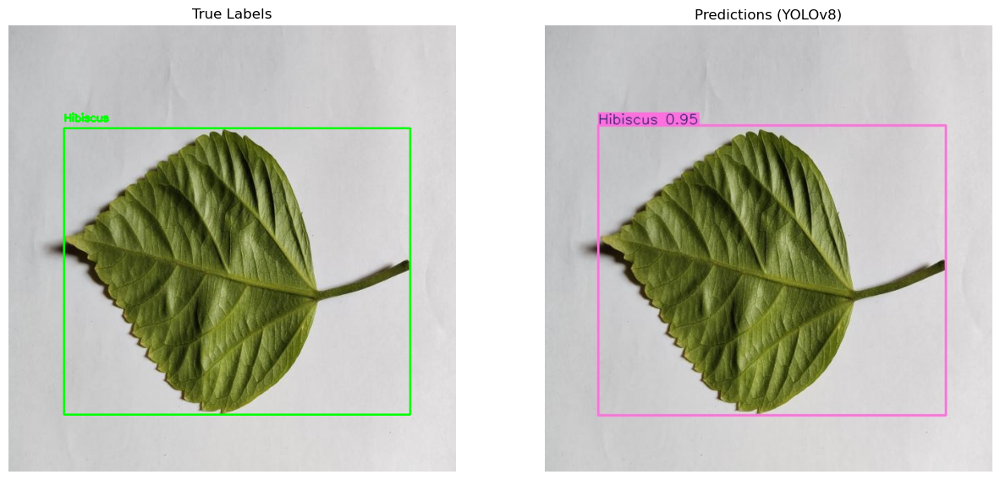

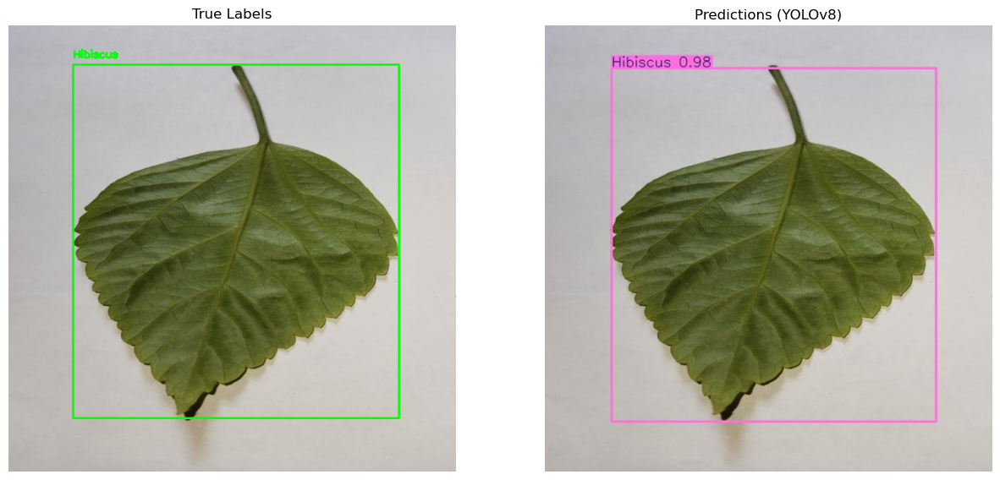

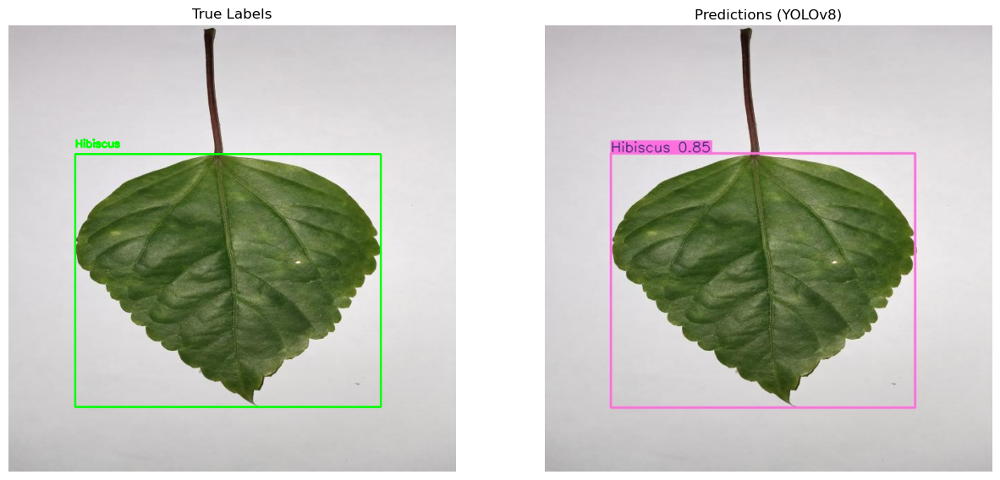

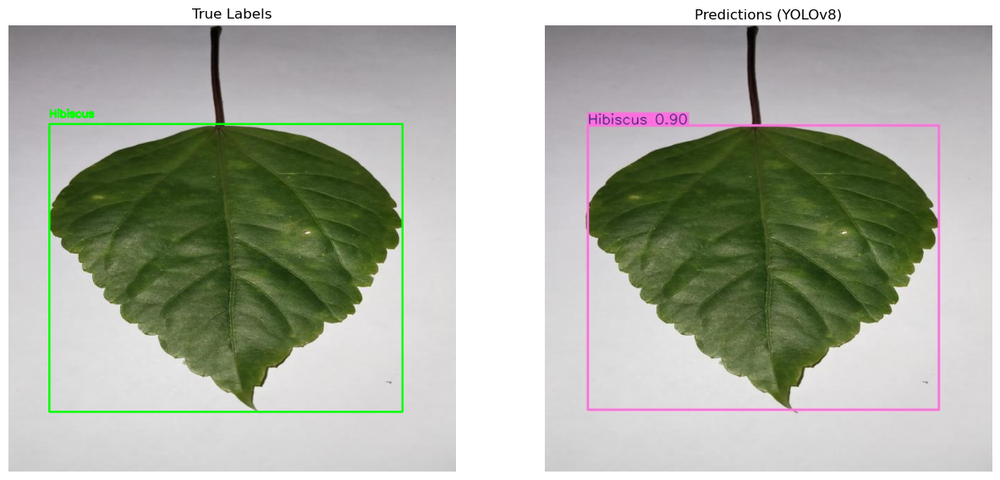

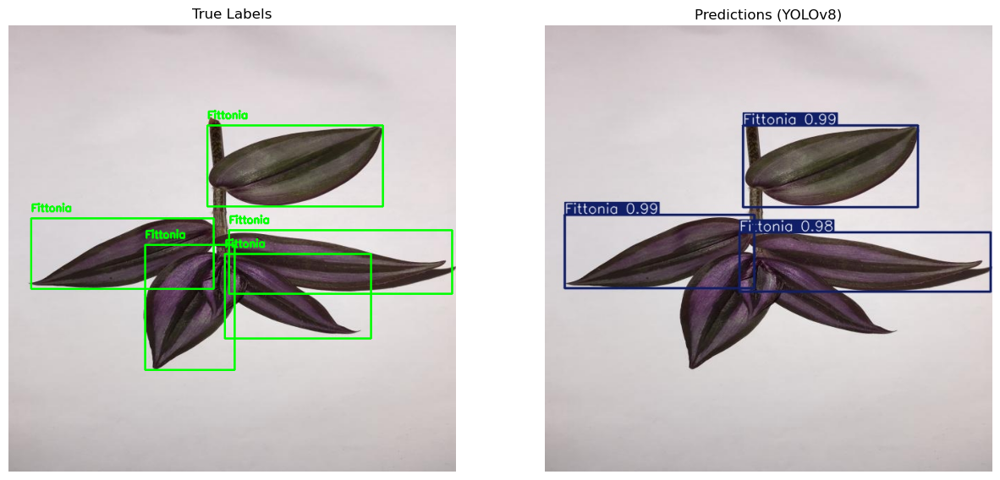

...

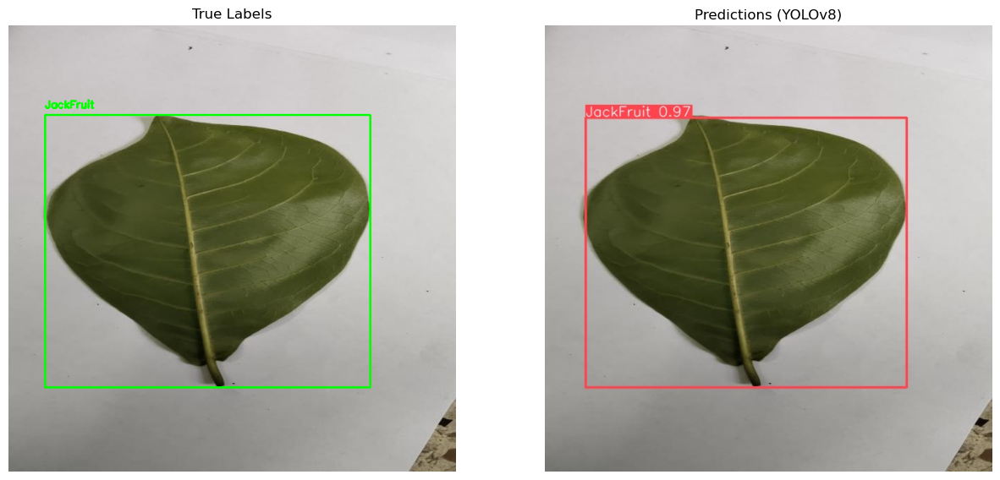

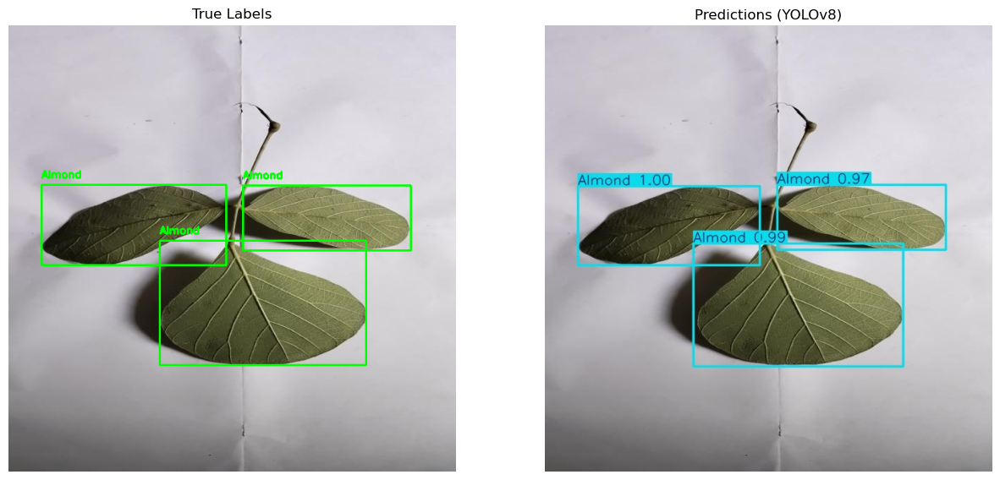

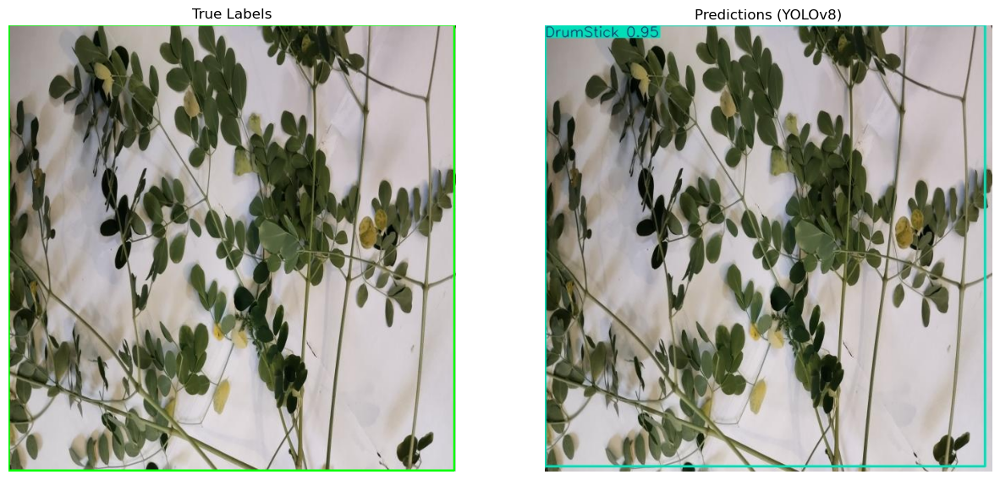

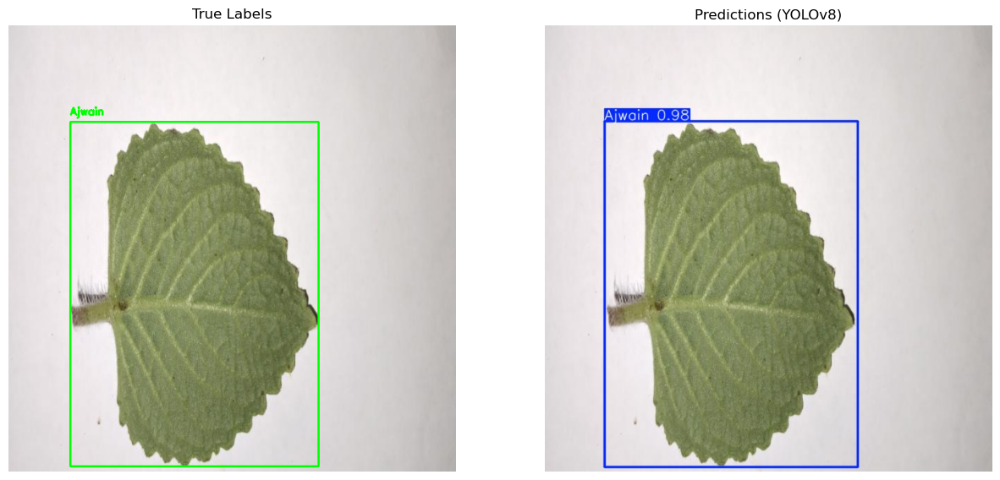

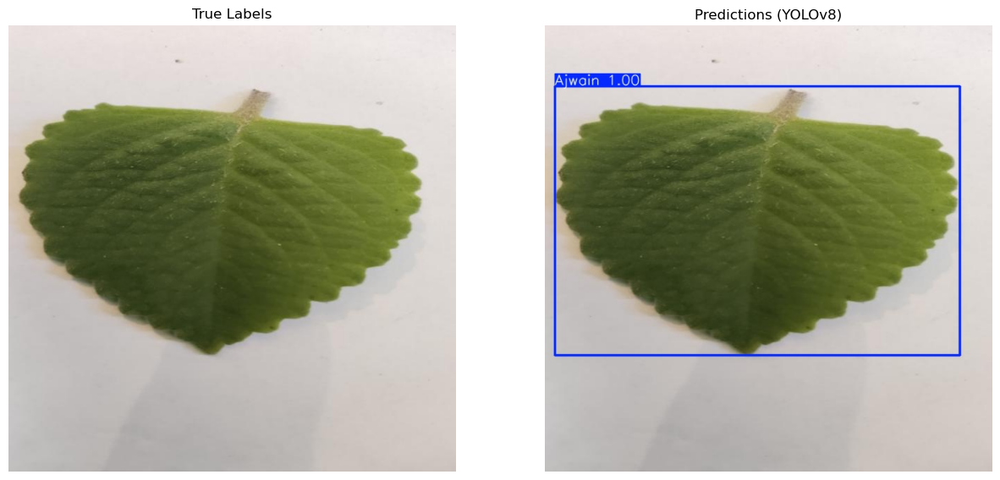

In [12]:
for img_file in os.listdir(test_images_path):
    if img_file.endswith((".jpg", ".png")):
        img_path = os.path.join(test_images_path, img_file)
        label_file = os.path.join(test_labels_path, os.path.splitext(img_file)[0] + ".txt")

        # Read the image
        img = cv2.imread(img_path)
        img_height, img_width = img.shape[:2]

        # Load true labels
        true_labels = load_true_labels(label_file)

        # Draw true labels
        for cls_id, bbox in true_labels:
            bbox_pixel = denormalize_bbox(bbox, img_width, img_height)
            cv2.rectangle(img, (bbox_pixel[0], bbox_pixel[1]), (bbox_pixel[2], bbox_pixel[3]), (0, 255, 0), 2)
            cv2.putText(img, f"{model.names[cls_id]}", (bbox_pixel[0], bbox_pixel[1] - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Load predicted image from YOLO results
        predicted_img_path = os.path.join(results[0].save_dir, img_file)
        predicted_img = cv2.imread(predicted_img_path)

        # Display side-by-side: True labels and predictions
        fig, ax = plt.subplots(1, 2, figsize=(15, 10))
        ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[0].set_title("True Labels")
        ax[0].axis("off")

        ax[1].imshow(cv2.cvtColor(predicted_img, cv2.COLOR_BGR2RGB))
        ax[1].set_title("Predictions (YOLOv8)")
        ax[1].axis("off")

        plt.show()

# 3. Metric Evaluation

In [ ]:
# Evaluate the model on the test set
metrics = model.val(
    data=data_yaml_path,       
    split="test",            
    conf=0.5,                
    iou=0.5,                 
    device="cuda"            
)

# Print metrics
print(metrics)


Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/drive/MyDrive/Leaf Dataset/roboflow/test/labels... 24 images, 1 backgrounds, 0 corrupt: 100%|██████████| 24/24 [00:14<00:00,  1.66it/s]

val: New cache created: /content/drive/MyDrive/Leaf Dataset/roboflow/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]


                   all         24         38      0.922      0.988      0.917      0.883
                Ajwain          1          1        0.5          1      0.497      0.497
                Almond          1          3          1          1      0.995      0.951
                Ashoka          5          5          1          1      0.995      0.898
             DrumStick          1          1          1          1      0.995      0.995
              Fittonia          5          9        0.8      0.889      0.794      0.689
              Hibiscus          4          4          1          1      0.995      0.995
             JackFruit          3          3          1          1      0.995      0.995
                 Mango          2          2          1          1      0.995      0.995
                  Neem          1         10          1          1      0.995      0.934
Speed: 0.4ms preprocess, 25.8ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detec

# Optional Code

In [9]:
import shutil
from google.colab import files

# Specify the directory to compress and download
directory_path = "/content/runs/detect/predict"  # Replace with your folder's name
output_zip_file = "/content/runs/detect/predict.zip"

# Compress the directory into a zip file
shutil.make_archive(base_name=directory_path, format="zip", root_dir=directory_path)

# Download the zip file
files.download(output_zip_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>